# Figure 1: Athletes Brain Study - Refactored

This notebook demonstrates the refactored, modular approach to generating Figure 1 for the athletes brain study.
The analysis has been organized into reusable modules within the `athletes_brain.fig1` package.

## Setup and Imports

Import the refactored modules from our package.

In [1]:
# Standard imports
from pathlib import Path
import pandas as pd
import numpy as np

# Import our refactored modules
from athletes_brain.fig1 import (
    Fig1Config,
    AthletesBrainDataLoader,
    GroupComparison,
    BrainPlotter,
    generate_figure1,
)

# Import specific functions for focused analysis
from athletes_brain.fig1.main import analyze_specific_comparison, get_most_significant_regions

2025-09-02 17:35:37.348 | INFO     | athletes_brain.config:<module>:11 - PROJ_ROOT path is: /home/galkepler/Projects/athletes_brain


## Configuration

Set up the configuration and visualization settings.

In [2]:
# Initialize configuration
config = Fig1Config()
config.METRICS = ["gm_vol", "adc"]

# Set up matplotlib configuration for consistent plots
config.setup_matplotlib_config()

# Display configuration
print(f"Atlas: {config.ATLAS}")
print(f"Metrics: {config.METRICS}")
print(
    f"Group labels: {config.CLIMBER_GROUP_LABEL}, {config.BJJ_GROUP_LABEL}, {config.CONTROL_GROUP_LABEL}"
)
print(f"P-value threshold: {config.P_THRESHOLD}")
print(f"Visualization range: [{config.VMIN}, {config.VMAX}]")

Atlas: schaefer2018tian2020_400_7
Metrics: ['gm_vol', 'adc']
Group labels: Climbing, Bjj, Control
P-value threshold: 0.05
Visualization range: [-5, 5]


## Quick Analysis: Generate Complete Figure 1

Use the main function to generate all comparisons and visualizations.

In [3]:
FORCE = False
# Generate complete Figure 1
output_dir = Path("/media/storage/phd") / "athletes_brain" / "figures" / "scns_athletes"
# generate_figure1(output_dir=output_dir, config=config)

## Step-by-Step Analysis

For more control, we can run each step individually using the modular components.

### 1. Data Loading

In [4]:
# Initialize data loader
data_loader = AthletesBrainDataLoader(config)

# Load all data
metric_data, parcels, nifti_path, nifti_matlab_path = data_loader.load_all_data()

print(f"Loaded {len(metric_data)} metrics")
print(f"Loaded {len(parcels)} brain parcels")
print(f"Metrics: {list(metric_data.keys())}")

metric_data = {key: val[val["cs_valid"]] for key, val in metric_data.items()}

# Display sample data (demographics)
d = metric_data["gm_vol"].drop_duplicates(subset=["subject_code"], keep="first")
print(f"N participants: {d.shape[0]}")

2025-09-02 17:35:57.524 | INFO     | athletes_brain.fig1.data_loader:load_metric_data:48 - Loading metric data...
2025-09-02 17:35:57.525 | INFO     | athletes_brain.fig1.data_loader:load_metric_data:54 - Loading gm_vol data


/home/galkepler/Projects/athletes_brain/athletes_brain/fig1/data_loader.py:57: DtypeWarning: Columns (1,6,7,8,9,10,11,12,68,74,78,79,80,81,82,84,85,86,87,92,93,94,95,96,97,99,113,115,116,121,122,123,124,125,132,133,134) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(self.processed_dir / f"{metric}.csv", index_col=0).reset_index(


2025-09-02 17:36:15.346 | INFO     | athletes_brain.fig1.data_loader:load_metric_data:82 - Loaded 1595356 records for gm_vol
2025-09-02 17:36:15.347 | INFO     | athletes_brain.fig1.data_loader:load_metric_data:54 - Loading adc data


/home/galkepler/Projects/athletes_brain/athletes_brain/fig1/data_loader.py:57: DtypeWarning: Columns (16,23,24,25,26,27,33,39,43,44,45,46,47,49,50,51,52,57,58,59,60,61,62,64,78,80,81,86,87,88,89,96,97,98,108) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(self.processed_dir / f"{metric}.csv", index_col=0).reset_index(


2025-09-02 17:36:28.746 | INFO     | athletes_brain.fig1.data_loader:load_metric_data:82 - Loaded 1600350 records for adc
2025-09-02 17:36:28.747 | SUCCESS  | athletes_brain.fig1.data_loader:load_metric_data:84 - Successfully loaded 2 metrics
2025-09-02 17:36:28.747 | INFO     | athletes_brain.fig1.data_loader:load_atlas_data:32 - Loading atlas data for schaefer2018tian2020_400_7
2025-09-02 17:36:28.748 | INFO     | athletes_brain.fig1.data_loader:load_atlas_data:39 - Loaded 454 parcels from atlas
Loaded 2 metrics
Loaded 454 brain parcels
Metrics: ['gm_vol', 'adc']
N participants: 1550


### 2. Statistical Analysis

In [89]:
# ======= helpers: positive weights + density + node metrics =======
import numpy as np
import pandas as pd
from sklearn.covariance import OAS, LedoitWolf
from numpy.random import default_rng
from statsmodels.stats.multitest import multipletests
from scipy.stats import norm
from itertools import combinations
from tqdm import tqdm


# ------------------------
# 0) Residualize by covariates
# ------------------------
def residualize_long(
    df, value_col="value", roi_col="roi", covars=("age", "age2", "sex", "tiv", "site")
):
    d = df.copy()
    if "age2" not in d and "age" in d:
        d["age2"] = (d["age"] - d["age"].mean()) ** 2
        d["age"] = d["age"] - d["age"].mean()
    # Fit OLS per ROI: value ~ covars (add intercept automatically)
    # Fast vectorized approach: design matrix once, then solve per ROI.
    X = pd.get_dummies(d[list(covars)], drop_first=True).assign(const=1.0)
    colsX = X.columns
    X = X.values
    out = []
    for roi, sub in d.groupby(roi_col):
        y = sub[value_col].to_numpy()
        # Align X rows to sub
        X_sub = X[sub.index, :]
        # OLS beta = (X'X)^(-1) X'y
        XtX = X_sub.T @ X_sub
        try:
            beta = np.linalg.solve(XtX, X_sub.T @ y)
        except np.linalg.LinAlgError:
            beta = np.linalg.pinv(XtX) @ (X_sub.T @ y)
        yhat = X_sub @ beta
        resid = y - yhat
        tmp = sub[["subject_code", roi_col]].copy()
        tmp["resid"] = resid
        out.append(tmp)
    resid_long = pd.concat(out, ignore_index=True)
    return resid_long


# ------------------------
# 1) Long → Wide per group (subjects × ROIs)
# ------------------------
def long_to_wide(resid_long, group_df, group_col="group_label", roi_col="roi"):
    # group_df has subject_code, group_label
    M = resid_long.pivot(index="subject_code", columns=roi_col, values="resid")
    M = M.dropna(axis=0, how="any")  # keep subjects with complete data (or impute)
    labels = group_df.set_index("subject_code").loc[M.index, group_col]
    return M, labels


# ------------------------
# 3) Edgewise Fisher z test
# ------------------------
def fisher_z_diff(R1, R2, n1, n2):
    # R1, R2 are pandas DataFrames with same ROI order; return z and p for upper triangle
    rois = R1.columns
    zmap = pd.DataFrame(np.nan, index=rois, columns=rois)
    pmap = pd.DataFrame(np.nan, index=rois, columns=rois)
    s = np.sqrt(1 / (n1 - 3) + 1 / (n2 - 3))
    for i, j in combinations(range(len(rois)), 2):
        r1, r2 = R1.iat[i, j], R2.iat[i, j]
        z = (np.arctanh(r1) - np.arctanh(r2)) / s
        p = 2 * (1 - norm.cdf(abs(z)))
        zmap.iat[i, j] = z
        pmap.iat[i, j] = p
    return zmap, pmap


def shrinkage_corr(X: pd.DataFrame, method="oas") -> pd.DataFrame:
    """Shrinkage correlation on z-scored columns (subjects×ROIs DataFrame)."""
    Xz = (X - X.mean(0)) / X.std(0, ddof=0).replace(0, 1)
    est = OAS() if method == "oas" else LedoitWolf()
    est.fit(Xz.values)
    C = est.covariance_
    d = np.sqrt(np.outer(np.diag(C), np.diag(C)))
    R = C / d
    np.fill_diagonal(R, 1.0)
    return pd.DataFrame(R, index=X.columns, columns=X.columns)


def to_positive_weights(R: pd.DataFrame, mode="abs") -> pd.DataFrame:
    """Map correlations to non-negative weights for path/graph metrics."""
    W = R.values.copy()
    np.fill_diagonal(W, 0.0)
    if mode == "abs":
        W = np.abs(W)
    elif mode == "r_to_01":
        W = (W + 1.0) / 2.0
        W[W < 0] = 0.0
    else:
        raise ValueError("mode must be 'abs' or 'r_to_01'")
    return pd.DataFrame(W, index=R.index, columns=R.columns)


def threshold_density(W: pd.DataFrame, density=0.1) -> pd.DataFrame:
    """Proportional threshold (keep top-K% by weight magnitude)."""
    A = W.values.copy()
    np.fill_diagonal(A, 0.0)
    iu = np.triu_indices_from(A, 1)
    k = int(np.floor(density * len(iu[0])))
    if k < 1:
        Z = np.zeros_like(A)
        return pd.DataFrame(Z, index=W.index, columns=W.columns)
    cutoff = np.partition(A[iu], -k)[-k]
    keep = A >= cutoff
    A_thr = np.where(keep, A, 0.0)
    np.fill_diagonal(A_thr, 0.0)
    return pd.DataFrame(A_thr, index=W.index, columns=W.columns)


def node_strength(W: pd.DataFrame) -> pd.Series:
    """Absolute node strength (sum of weights)."""
    return pd.Series(np.abs(W.values).sum(axis=1), index=W.index, name="strength")


def node_degree(W: pd.DataFrame) -> pd.Series:
    """Node degree (count of non-zero edges)."""
    return pd.Series((W.values != 0).sum(axis=1), index=W.index, name="degree")


def auc_node_metric(
    WA: pd.DataFrame, WC: pd.DataFrame, densities, metric="strength"
) -> tuple[pd.Series, pd.Series, pd.Series]:
    """Compute node metric for Athletes/Controls and AUC across densities (mean over densities)."""
    SA, SC = [], []
    for d in densities:
        WA_d = threshold_density(WA, density=d)
        WC_d = threshold_density(WC, density=d)
        mA = node_strength(WA_d) if metric == "strength" else node_degree(WA_d)
        mC = node_strength(WC_d) if metric == "strength" else node_degree(WC_d)
        SA.append(mA)
        SC.append(mC)
    SA = pd.concat(SA, axis=1).mean(1)
    SC = pd.concat(SC, axis=1).mean(1)
    return SA, SC, (SA - SC)  # Athletes − Controls


def permute_node_metric(
    M: pd.DataFrame,
    labels_bool: pd.Series,
    densities,
    metric="strength",
    n_perm=2000,
    method="oas",
    seed=0,
):
    """
    Permutation test for node metric AUC difference (Athletes − Controls).
    Keeps group sizes fixed; returns obs diff, p_unc, p_fwer, q_fdr.
    """
    rng = default_rng(seed)
    labels_bool = labels_bool.astype(bool).loc[M.index]  # align
    idxA = labels_bool[labels_bool].index
    idxC = labels_bool[~labels_bool].index
    nA = len(idxA)
    subs = M.index.to_numpy()

    # observed
    RA = shrinkage_corr(M.loc[idxA], method)
    RC = shrinkage_corr(M.loc[idxC], method)
    WA, WC = to_positive_weights(RA, "abs"), to_positive_weights(RC, "abs")
    _, _, diff_obs = auc_node_metric(WA, WC, densities, metric=metric)
    nodes = diff_obs.index
    obs = diff_obs.values

    # permutations
    diffs = np.empty((n_perm, len(nodes)), dtype=float)
    for b in tqdm(range(n_perm), desc="Permutations", total=n_perm):
        permA = rng.choice(subs, size=nA, replace=False)
        maskA = np.isin(subs, permA)
        RAp = shrinkage_corr(M.iloc[maskA], method)
        RCp = shrinkage_corr(M.iloc[~maskA], method)
        WAp, WCp = to_positive_weights(RAp, "abs"), to_positive_weights(RCp, "abs")
        _, _, d_b = auc_node_metric(WAp, WCp, densities, metric=metric)
        diffs[b, :] = d_b.loc[nodes].values

    # p-values
    p_unc = (np.abs(diffs) >= np.abs(obs)).mean(axis=0)
    max_abs = np.max(np.abs(diffs), axis=1)
    p_fwer = (max_abs[:, None] >= np.abs(obs)[None, :]).mean(axis=0)
    q_fdr = multipletests(p_unc, method="fdr_bh")[1]

    return (
        pd.DataFrame(diffs, index=range(n_perm), columns=nodes),
        pd.Series(obs, index=nodes, name=f"diff_{metric}"),
        pd.Series(p_unc, index=nodes, name=f"p_{metric}_unc"),
        pd.Series(p_fwer, index=nodes, name=f"p_{metric}_fwer"),
        pd.Series(q_fdr, index=nodes, name=f"q_{metric}_fdr"),
    )

In [ ]:
from statsmodels.stats.multitest import multipletests

N_PERM = 1000

densities = np.linspace(0.05, 0.30, 6)  # 5%..30% AUC

metrics = config.METRICS
cov_names = {
    m: ["age_at_scan", "sex"] if "vol" not in m else ["age_at_scan", "sex", "tiv"] for m in metrics
}

all_node_results = []

for metric, df in metric_data.items():
    # one scan per subject (first chronologically)
    df_cs = (
        df.sort_values("session_id")
        .drop_duplicates(subset=["subject_code", config.REGION_COL], keep="first")
        .reset_index(drop=True)
    )

    # residualize per ROI on covariates for the whole cohort
    resid_long = residualize_long(
        df_cs, value_col="value", roi_col=config.REGION_COL, covars=cov_names[metric]
    )

    # wide residuals and boolean labels (True = Athlete; assumes 'target' is boolean)
    M, labels = long_to_wide(
        resid_long,
        df_cs[["subject_code", "target"]],
        group_col="target",
        roi_col=config.REGION_COL,
    )
    labels = labels[~labels.index.duplicated(keep="first")]  # de-dup labels
    M = M.loc[labels.index]  # align

    # (optional) quick edgewise z-test like you already have
    XA, XC = M[labels], M[~labels]
    R_A = shrinkage_corr(XA, method="oas")
    R_C = shrinkage_corr(XC, method="oas")
    zmap, pmap = fisher_z_diff(R_A, R_C, n1=XA.shape[0], n2=XC.shape[0])
    upper = pmap.stack().dropna()
    q = pd.Series(np.nan, index=upper.index)
    q.loc[upper.index] = multipletests(upper.values, method="fdr_bh")[1]
    qmap = pmap.copy()
    qmap.values[np.triu_indices_from(qmap, 1)] = q.values.reshape(-1)

    # ----- node metrics (AUC across densities) with permutation p-values -----
    # Strength
    null_diffsS, diffS, pS, pS_fwer, qS = permute_node_metric(
        M, labels, densities, metric="strength", n_perm=N_PERM, method="oas", seed=42
    )
    # Degree
    null_diffsD, diffD, pD, pD_fwer, qD = permute_node_metric(
        M, labels, densities, metric="degree", n_perm=N_PERM, method="oas", seed=43
    )

    node_df = pd.DataFrame(
        {
            "node": diffS.index,
            "metric": metric,
            "n_athletes": int(labels.sum()),
            "n_controls": int((~labels).sum()),
            "strength_diff": diffS.values,  # Athletes − Controls (AUC)
            "strength_p_unc": pS.values,
            "strength_p_fwer": pS_fwer.values,
            "strength_q_fdr": qS.values,
            "degree_diff": diffD.values,  # Athletes − Controls (AUC)
            "degree_p_unc": pD.values,
            "degree_p_fwer": pD_fwer.values,
            "degree_q_fdr": qD.values,
        }
    )
    all_node_results.append(node_df)
    break

# Final node-wise results across metrics
node_results = pd.concat(all_node_results, ignore_index=True)

Permutations: 100%|██████████| 50/50 [00:24<00:00,  2.00it/s]


In [126]:
import matplotlib.pyplot as plt

null_diffsS, diffS, pS, pS_fwer, qS = permute_node_metric(
    M, labels, densities, metric="strength", n_perm=1000, method="spearman", seed=42
)

Permutations: 100%|██████████| 1000/1000 [23:09<00:00,  1.39s/it]


In [127]:
qS.sort_values()
# parcels.loc[309]

index
310    0.000000
334    0.454000
136    0.454000
131    0.454000
343    0.454000
         ...   
250    0.994764
268    0.995385
164    0.995385
398    0.998199
403    0.999000
Name: q_strength_fdr, Length: 454, dtype: float64

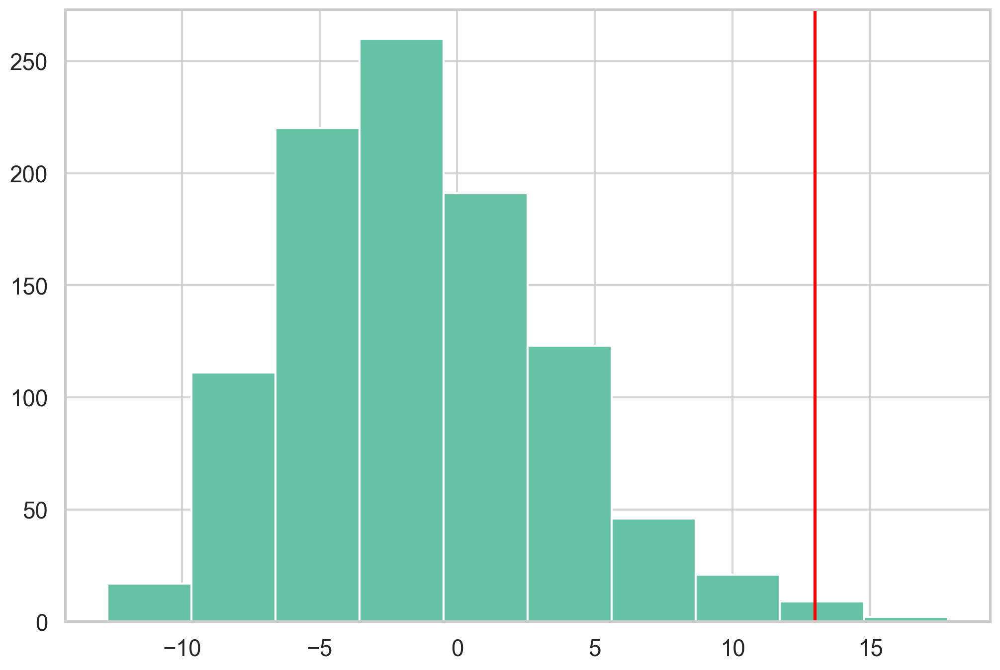

In [129]:
roi = 334
null = null_diffsS[roi]
plt.hist(null)
plt.axvline(diffS.loc[roi], color="red")

In [11]:
import pandas as pd
from functools import reduce

region_col = config.REGION_COL


def long_to_wide(
    long_df,
    *,
    index="subject_code",
    columns=region_col,
    values="value",
):
    """Pivot a long metric table → wide DataFrame (subjects × regions)."""
    wide = long_df.pivot_table(index=index, columns=columns, values=values)
    # Optional: drop regions with >20 % missing values
    # thresh = int(0.8 * len(wide))
    # wide = wide.dropna(axis=1, thresh=thresh)
    # Optional: drop subejcts with >20 % missing values
    # thresh = int(0.8 * len(parcels))
    # wide = wide.dropna(axis=0, thresh=thresh)
    return wide


def prep_metric_matrices(metric_dict, *, index="subject_code", target_column="target"):
    """
    Parameters
    ----------
    metric_dict : {metric_name: long_df}
        Each DataFrame must include `subject_id`, `region`, `value`,
        `age_at_scan`, and any covariates you want.
    Returns
    -------
    X_dict : {metric_name: ndarray}
             Wide feature matrices aligned on the *intersection* of subjects.
    y, w, cov_df : Series / ndarray
             Age, weights, and any extra covariates for the same subjects.
    """
    # 1.  Convert every long → wide
    wide_dict = {m: long_to_wide(df, index=index) for m, df in metric_dict.items()}

    # 2.  Intersect subject index across all metrics
    common_subs = reduce(pd.Index.intersection, [w.index for w in wide_dict.values()])

    # 3.  Slice & order every matrix
    for m in wide_dict:
        wide_dict[m] = wide_dict[m].loc[common_subs]

    # 4.  Pull y, w, covariates from *any* of the long dfs (they all duplicate)
    ref_long = next(iter(metric_dict.values()))
    ref_meta = (
        ref_long.drop_duplicates(subset=index)  # one row per subject
        .set_index(index)
        .reindex(common_subs)
    )
    # ref_meta = ref_long[ref_long[index].isin(common_subs)]
    y = ref_meta[target_column].astype(bool)  # target column must be boolean

    cov = ref_meta[ref_meta.columns.difference([target_column])]

    # 5.  Convert features to numpy (sklearn ready)
    X_dict = {m: wide for m, wide in wide_dict.items()}
    return X_dict, y, cov

In [15]:
# -------------------------------------------------------
# Build (X, y, w, cov) once, re-use in every metric loop
# -------------------------------------------------------
metrics = config.METRICS
X_dict, y, cov = prep_metric_matrices(metric_data, index="subject_code")
# y_mean = y.mean()
# y = y - y_mean  # center the target variable
# Example list of covariates you want to *keep* (z-scored later if needed)
cov_names = {
    m: ["age_at_scan", "sex"] if "vol" not in m else ["age_at_scan", "sex", "tiv"] for m in metrics
}  # e.g. ["sex", "tiv"]

In [29]:
from statsmodels.stats.multitest import multipletests
from tqdm import tqdm
import statsmodels.formula.api as smf


scns = {}
for metric, df in X_dict.items():
    wide_df = df.copy()
    covariates = cov_names[metric]
    scns[metric] = {}
    print(f"Analyzing metric: {metric}")
    for col in wide_df.columns:
        df_tmp = wide_df.copy()
        df_tmp["value"] = wide_df[col]
        df_tmp[covariates] = cov[covariates]
        model = smf.ols("value ~ " + " + ".join(covariates), data=df_tmp).fit()
        wide_df[col] = model.resid + model.params["Intercept"]
    df_athletes = wide_df[y]
    df_controls = wide_df[~y]
    for group_name, region_matrix in zip(["athletes", "controls"], [df_athletes, df_controls]):
        # Create a new column for each age group
        corr_matrix = region_matrix.corr(method="spearman")
        scns[group_name] = {
            "corr_matrix": corr_matrix,
            "metadata": cov[y if group_name == "athletes" else ~y],
        }
        break
    break

Analyzing metric: gm_vol


In [8]:
from statsmodels.stats.multitest import multipletests
from tqdm import tqdm

for metric, df in metric_data.items():
    print(f"Analyzing metric: {metric}")
    for group in ["Climbing", "Bjj"]:
        stats_file = output_dir / metric / f"{group.lower()}_vs_controls" / "stats.csv"
        stats_file.parent.mkdir(parents=True, exist_ok=True)
        if stats_file.exists() and not FORCE:
            stats = pd.read_csv(stats_file)
            results[metric][f"{group.lower()}_vs_controls"] = stats
            continue
        group_df = df[(df["group"] == group) | (~df["target"].astype(bool))]
        stats = parcels.copy()
        for i, row in tqdm(parcels.iterrows(), total=parcels.shape[0], desc="Processing parcels"):
            roi_df = group_df[group_df["index"] == row["index"]]
            out, res = analyze_with_class_weights(roi_df, metric=metric)
            for key, val in out.items():
                if key == "ci95":
                    stats.loc[i, f"{key}_lower"] = val[0]
                    stats.loc[i, f"{key}_upper"] = val[1]
                elif key == "target_mix":
                    stats.loc[i, f"{key}_athlete"] = val["True"]
                    stats.loc[i, f"{key}_control"] = val["False"]
                else:
                    stats.loc[i, key] = val
            # break
        pvals = stats["p_value"].values
        _, corrected_pvals, _, _ = multipletests(pvals, method="fdr_bh")
        stats["p_value_corrected"] = corrected_pvals
        results[metric][f"{group.lower()}_vs_controls"] = stats
        stats.to_csv(stats_file, index=False)

        # break

Analyzing metric: gm_vol


Processing parcels: 100%|██████████| 454/454 [00:10<00:00, 43.24it/s]


Analyzing metric: adc


Processing parcels: 100%|██████████| 454/454 [00:08<00:00, 54.31it/s]


In [9]:
df = metric_data["gm_vol"]
group_df = df[(df["group"] == "Bjj") | (~df["target"].astype(bool))]

In [10]:
group_df.drop_duplicates(subset="subject_code", keep="first")["target"].value_counts()

target
False    1411
True       53
Name: count, dtype: int64

In [11]:
from statsmodels.stats.multitest import multipletests
from tqdm import tqdm

groups = ["climbing", "bjj"]
reference_group = "climbing"

for metric, df in metric_data.items():
    print(f"Analyzing metric: {metric}")
    stats_file = output_dir / metric / "climbing_vs_bjj" / "stats.csv"
    stats_file.parent.mkdir(parents=True, exist_ok=True)
    if stats_file.exists() and not FORCE:
        stats = pd.read_csv(stats_file)
        results[metric]["climbing_vs_bjj"] = stats
        continue
    group_df = df[(df["target"].astype(bool)) & (df["group"].str.lower().isin(groups))]
    # reformat "target" to the reference group
    group_df["target"] = (
        group_df["group"].str.lower().apply(lambda x: "True" if x == reference_group else "False")
    )
    group_df["target"] = group_df["target"].astype(str)

    stats = parcels.copy()
    for i, row in tqdm(parcels.iterrows(), total=parcels.shape[0], desc="Processing parcels"):
        roi_df = group_df[group_df["index"] == row["index"]]
        out, res = analyze_with_class_weights(roi_df, metric=metric)
        for key, val in out.items():
            if key == "ci95":
                stats.loc[i, f"{key}_lower"] = val[0]
                stats.loc[i, f"{key}_upper"] = val[1]
            elif key == "target_mix":
                stats.loc[i, f"{key}_athlete"] = val["True"]
                stats.loc[i, f"{key}_control"] = val["False"]
            else:
                stats.loc[i, key] = val
        # break
    pvals = stats["p_value"].values
    _, corrected_pvals, _, _ = multipletests(pvals, method="fdr_bh")
    stats["p_value_corrected"] = corrected_pvals
    results[metric]["climbing_vs_bjj"] = stats
    stats.to_csv(stats_file, index=False)
    # break

    # break

Analyzing metric: gm_vol


/tmp/ipykernel_3421689/1654356401.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_df["target"] = (
/tmp/ipykernel_3421689/1654356401.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_df["target"] = group_df["target"].astype(str)
Processing parcels: 100%|██████████| 454/454 [00:03<00:00, 118.64it/s]
/tmp/ipykernel_3421689/1654356401.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Se

Analyzing metric: adc


Processing parcels: 100%|██████████| 454/454 [00:03<00:00, 130.10it/s]


In [12]:
results["gm_vol"]["athletes_vs_controls"].sort_values("p_value_corrected").head(20)

,index,name,base_name,Label Name,network,component,hemisphere,target_mix_athlete,target_mix_control,coef_delta,t,r_partial,r2_partial,ci95_lower,ci95_upper,p_value,n,effective_n,p_value_corrected
262,263,7Networks_RH_SomMot_33,7networks_rh_sommot,7Networks_RH_SomMot,somatomotor,somatomotor,R,0.5,0.5,18.109054,6.121849,0.153940,0.023697,12.306733,23.911376,1.170757e-09,1550.0,506.139355,5.315238e-07
20,21,7Networks_LH_Vis_21,7networks_lh_vis,7Networks_LH_Vis,visual,visual,L,0.5,0.5,70.535972,5.457231,0.137563,0.018923,45.183110,95.888835,5.625657e-08,1550.0,506.139355,1.222012e-05
125,126,7Networks_LH_Limbic_TempPole_8,7networks_lh_limbic_temppole,7Networks_LH_Limbic_TempPole,limbic,temporal pole,L,0.5,0.5,18.101006,5.391432,0.135935,0.018478,11.515529,24.686483,8.074967e-08,1550.0,506.139355,1.222012e-05
63,64,7Networks_LH_SomMot_33,7networks_lh_sommot,7Networks_LH_SomMot,somatomotor,somatomotor,L,0.5,0.5,40.691303,5.245203,0.132313,0.017507,25.474341,55.908265,1.777521e-07,1550.0,506.139355,1.638745e-05
268,269,7Networks_RH_SomMot_39,7networks_rh_sommot,7Networks_RH_SomMot,somatomotor,somatomotor,R,0.5,0.5,30.015751,5.242346,0.132242,0.017488,18.784912,41.246591,1.804785e-07,1550.0,506.139355,1.638745e-05
267,268,7Networks_RH_SomMot_38,7networks_rh_sommot,7Networks_RH_SomMot,somatomotor,somatomotor,R,0.5,0.5,32.713273,5.004991,0.126353,0.015965,19.892643,45.533902,6.226331e-07,1550.0,506.139355,4.457439e-05
218,219,7Networks_RH_Vis_19,7networks_rh_vis,7Networks_RH_Vis,visual,visual,R,0.5,0.5,80.446346,4.985622,0.125872,0.015844,48.796205,112.096486,6.872703e-07,1550.0,506.139355,4.457439e-05
293,294,7Networks_RH_SalVentAttn_TempOccPar_1,7networks_rh_salventattn_tempoccpar,7Networks_RH_SalVentAttn_TempOccPar,salience / ventral attention,temporal occipital parietal,R,0.5,0.5,31.526669,4.942871,0.124809,0.015577,19.015800,44.037538,8.536388e-07,1550.0,506.139355,4.844400e-05
64,65,7Networks_LH_SomMot_34,7networks_lh_sommot,7Networks_LH_SomMot,somatomotor,somatomotor,L,0.5,0.5,21.218538,4.891170,0.123524,0.015258,12.709286,29.727789,1.107021e-06,1550.0,506.139355,5.584304e-05
224,225,7Networks_RH_Vis_25,7networks_rh_vis,7Networks_RH_Vis,visual,visual,R,0.5,0.5,40.257009,4.850601,0.122515,0.015010,23.977749,56.536269,1.355142e-06,1550.0,506.139355,6.152346e-05


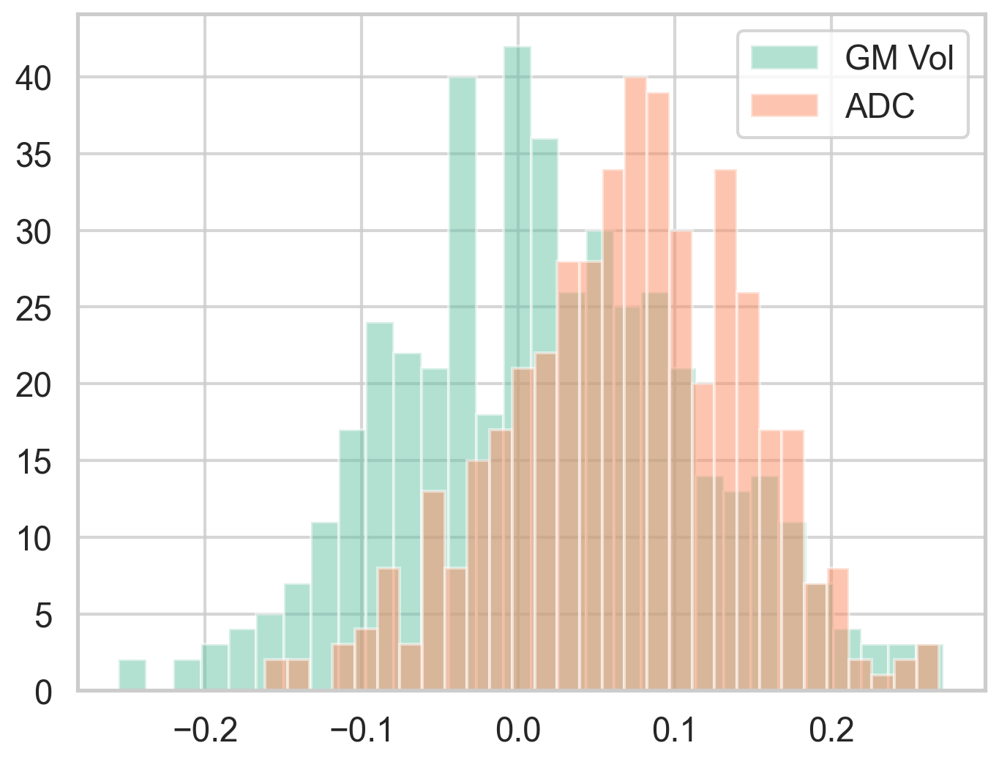

In [13]:
import matplotlib.pyplot as plt

# stats["coef_delta"].quantile([0.025, 0.975])

fig, ax = plt.subplots(1, 1, figsize=(8, 6))
ax.hist(results["gm_vol"]["climbing_vs_bjj"]["r_partial"], bins=30, alpha=0.5, label="GM Vol")
ax.hist(results["adc"]["climbing_vs_bjj"]["r_partial"], bins=30, alpha=0.5, label="ADC")
ax.legend()
# ax.hist(results["adc"]["climbing_vs_controls"]["
# results["gm_vol"]["athletes_vs_controls"]["r_partial"].hist()
# results["adc"]["athletes_vs_controls"]["r_partial"].hist()
# results["adc"]["climbing_vs_controls"]["r_partial"].hist()
# plt.axvline(x=-1.5e-05, color="red", linestyle="--")
# plt.axvline(x=1.5e-05, color="red", linestyle="--")
# Display the most significant regions

2025-09-02 11:14:53.829 | INFO     | athletes_brain.fig1.brain_visualization:plot_single_metric:276 - Creating brain plots for gm_vol_athletes_vs_controls
2025-09-02 11:14:53.829 | INFO     | athletes_brain.fig1.brain_visualization:setup_surfaces:30 - Setting up brain surfaces and parcellations
2025-09-02 11:14:53.832 | SUCCESS  | athletes_brain.fig1.brain_visualization:setup_surfaces:39 - Brain surfaces and parcellations loaded successfully
2025-09-02 11:14:53.832 | INFO     | athletes_brain.fig1.brain_visualization:prepare_value_maps:57 - Preparing value maps for r_partial
2025-09-02 11:14:53.848 | INFO     | athletes_brain.fig1.brain_visualization:prepare_value_maps:97 - Prepared maps with 200 LH, 200 RH, and 54 subcortical regions
2025-09-02 11:14:53.849 | INFO     | athletes_brain.fig1.brain_visualization:plot_cortical_surface:121 - Creating cortical surface plots
2025-09-02 11:14:53.857 | INFO     | athletes_brain.fig1.brain_visualization:plot_cortical_surface:143 - Plotting left

/home/galkepler/Projects/athletes_brain/venv/lib/python3.12/site-packages/surfplot/plotting.py:515: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=figsize)


2025-09-02 11:15:09.545 | INFO     | athletes_brain.fig1.brain_visualization:plot_cortical_surface:177 - Saved left hemisphere plot to /media/storage/phd/athletes_brain/figures/fig1/climbing_vs_controls/adc/left_adc_climbing_vs_controls.png
2025-09-02 11:15:09.545 | INFO     | athletes_brain.fig1.brain_visualization:plot_cortical_surface:143 - Plotting right hemisphere
2025-09-02 11:15:10.329 | INFO     | athletes_brain.fig1.brain_visualization:plot_cortical_surface:177 - Saved right hemisphere plot to /media/storage/phd/athletes_brain/figures/fig1/climbing_vs_controls/adc/right_adc_climbing_vs_controls.png
2025-09-02 11:15:10.329 | INFO     | athletes_brain.fig1.brain_visualization:plot_subcortical:193 - Creating subcortical plots
2025-09-02 11:15:10.329 | INFO     | athletes_brain.fig1.brain_visualization:plot_subcortical:196 - Plotting L subcortical regions
2025-09-02 11:15:10.828 | INFO     | athletes_brain.fig1.brain_visualization:plot_subcortical:213 - Saved L subcortical plot to

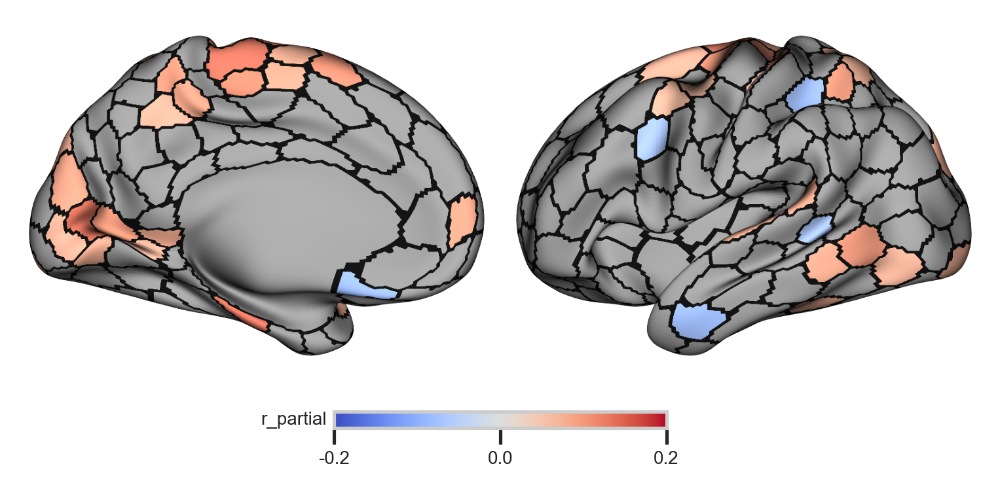

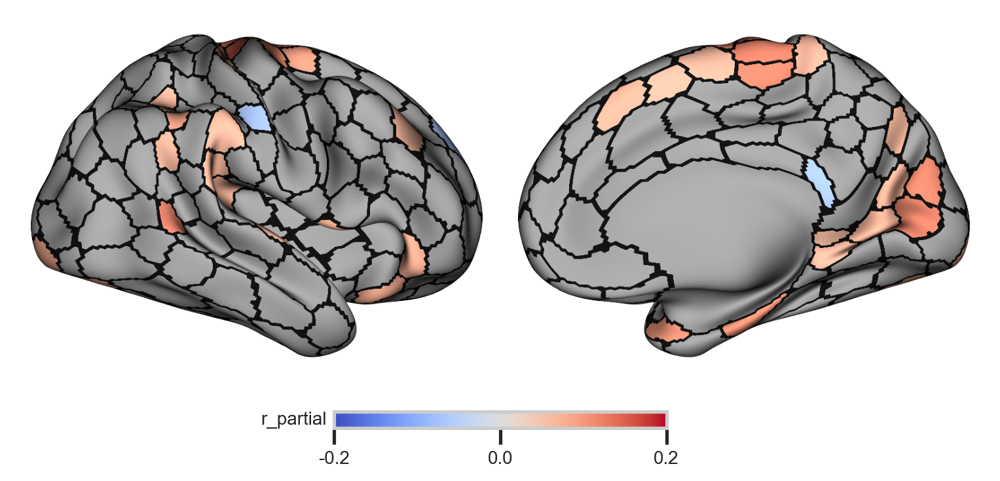

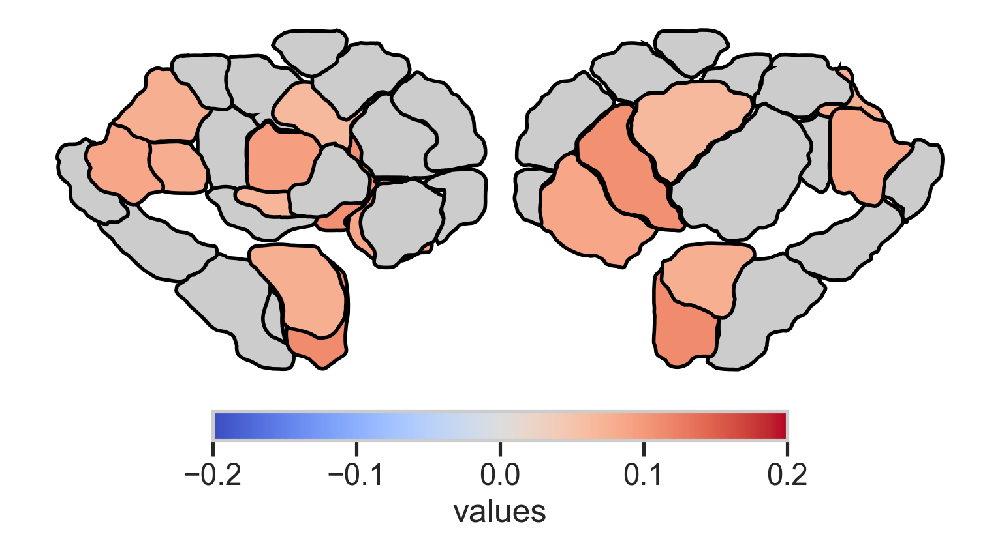

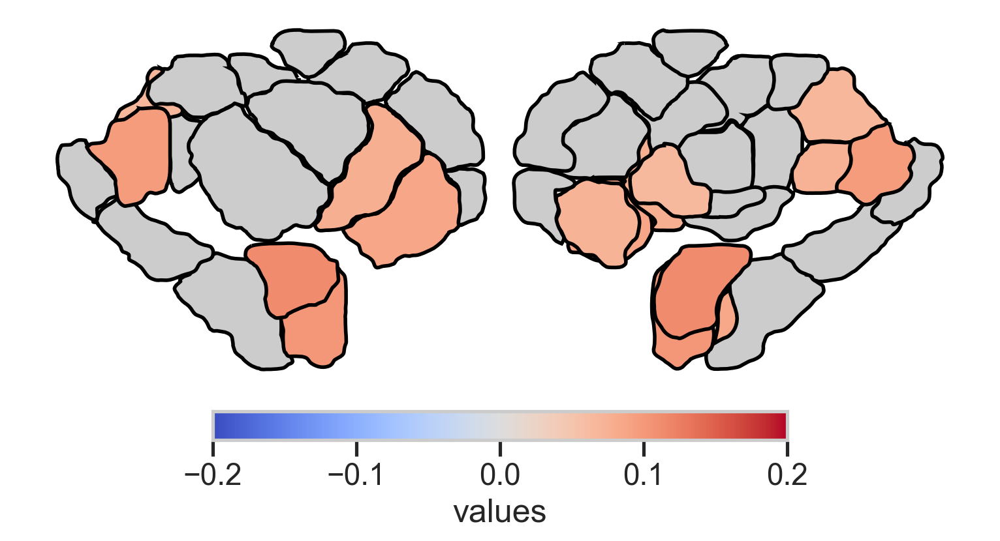

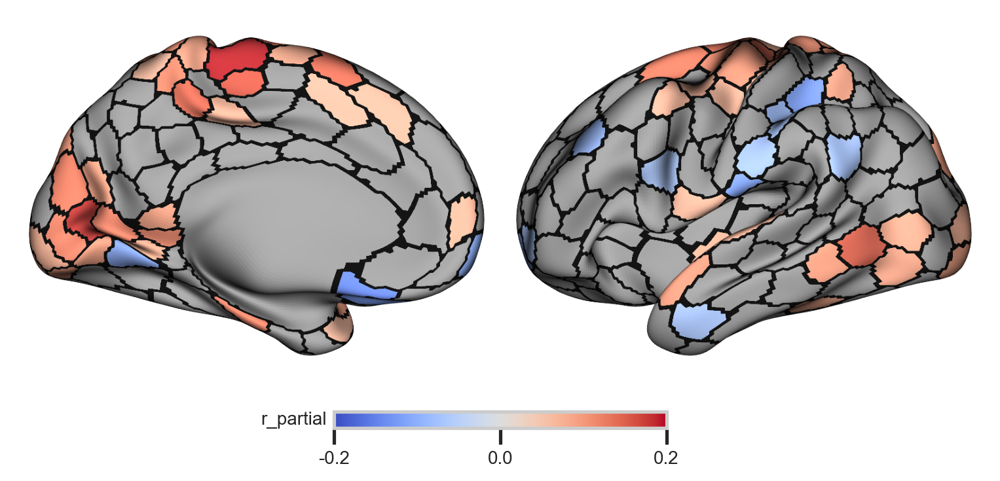

...

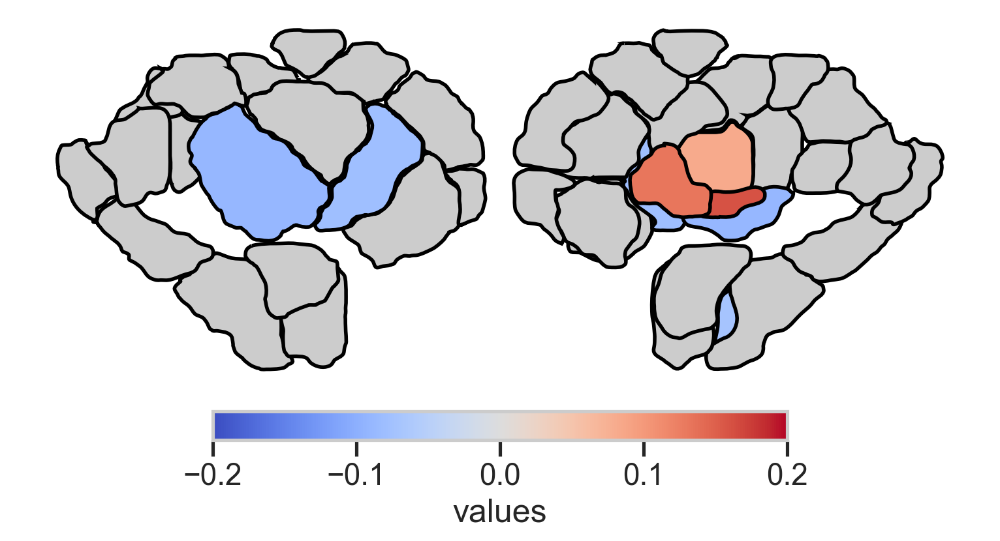

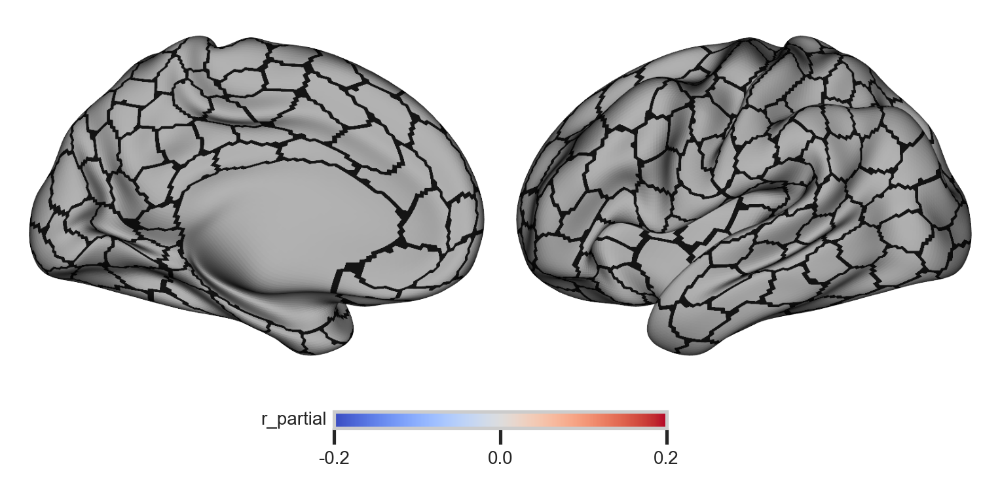

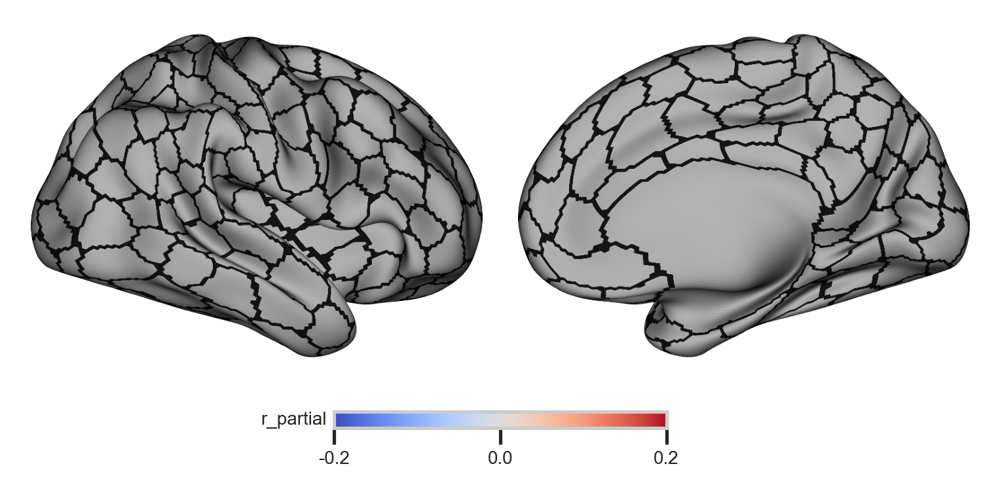

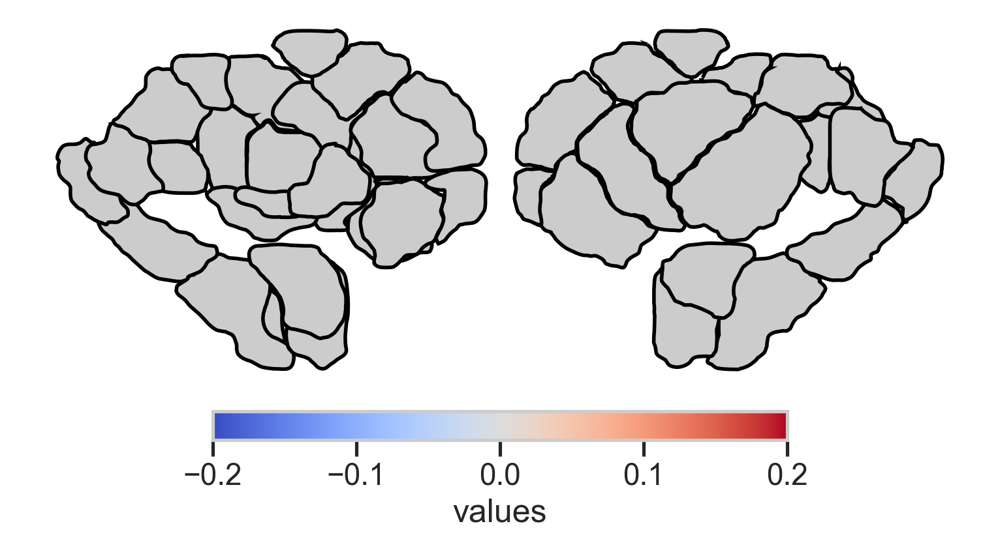

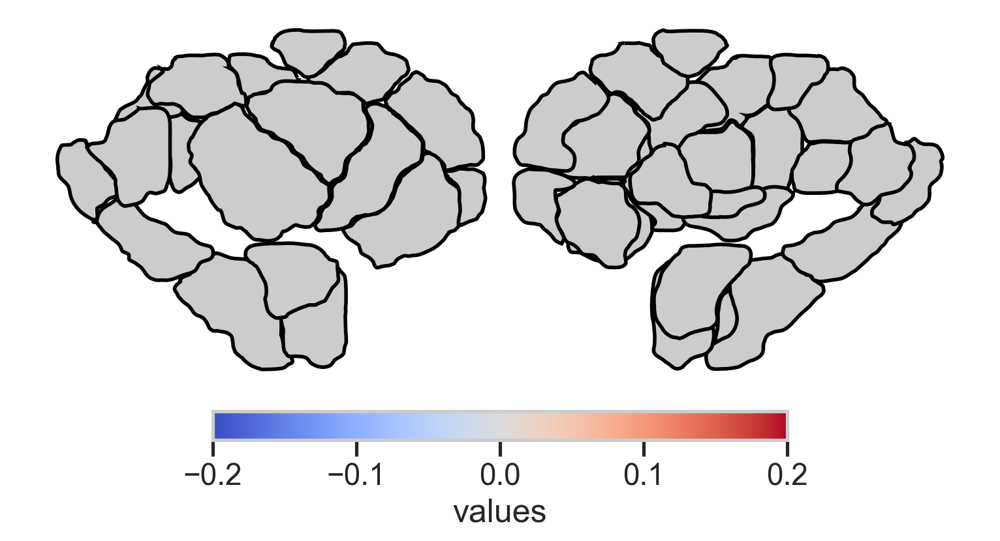

In [14]:
# visualize
metrics = ["gm_vol", "adc"]
analysis_levels = [
    "athletes_vs_controls",
    "climbing_vs_controls",
    "bjj_vs_controls",
    "climbing_vs_bjj",
]
# analysis_levels = ["climbing_vs_bjj"]
value_column = "r_partial"
vmin = -0.2
vmax = 0.2

for metric in metrics:
    for analysis_level in analysis_levels:
        metric_dir = output_dir / analysis_level / metric
        metric_dir.mkdir(parents=True, exist_ok=True)
        vis_df = results[metric][analysis_level].copy()

        vis_config = Fig1Config()
        vis_config.VMIN = vmin
        vis_config.VMAX = vmax

        #     break
        # break
        plotter = BrainPlotter(vis_config)
        metric_dir = output_dir / analysis_level / metric
        metric_dir.mkdir(parents=True, exist_ok=True)

        plotter.plot_single_metric(
            results_df=vis_df,
            metric_key=f"{metric}_{analysis_level}",
            output_dir=metric_dir,
            p_column="p_value_corrected",
            value_column=value_column,
        )
    #     break
    # break